<a href="https://colab.research.google.com/github/hectorlehmann/data_science_parte2/blob/main/ProyectoDs_parte_2_HectorLehamnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##TRABAJO DATA SCIENCE - PRIMERA PRE ENTREGA

##Analisis de ventas de bicicletas y accesorios:

Para este analisis contamos el (dataset) de una empresa dedicada a la venta de bicicletas y varios accesorios en varios paises de  europa, oceania y america del norte, este mismo esta representado por 18 columnas y 113036 filas.

En un primer analisis que se hizo no contiene ningun dato nulo (NaN), de las 18 columnas en total, cuenta con 4 dedicadas a las fechas, 7 de tipo cualitativo y el resto de tipo cuatitativo, por lo cual  se puede decir que es bastante equilibrado a la hora de analizar y realizar los graficos.

###OBJETIVO
Lograr predecir cuanto va a ser el ingreso("Revenue") en los proximos años

###CONTEXTO COMERCIAL
Creemos que realizando estos modelos se pueden resolver ciertas dudas en la empresa con respecto a su futuro y obtener una prediccion lo mas exacta posible a la hora de obtener las ganancias y los costos de cada venta

###HIPOTESIS Y PREGUNTAS

¿Cuantos hombres y mujeres participaron en las ventas?

¿Cual fue la categoria que tuvo mas ventas?

¿Cual fue la sub categoria que tuvo mas ventas?

¿Cual fue el pais que tuvo mas ventas?

¿Que año fue el que tuvo mas ingresos?

Hipotesis:

* 1) Segun lo que muestra el dataset puede ser que la categoria ("Bikes")fue la que tuvo mayor participacion en los ingresos.

*  2) Si es verdadera la primera hipotesis, se podria decir que, en base a sub categorias tambien lo relacionado a ("bikes") tuvo mayor participacion en ingresos.

*  3) Si en sub categorias, lo relacionado a ("bikes") tuvo mayo participacion, eso quiere decir que fue la mas vendida.  

*  4) Los adultos mayores (Entre 30 y 40 años ) son los que mas compras hicieron.  

*  5) El mes que mas ingresos tuvo fue el de diciembre.  

*  6)¿Cual fue el producto que mas ingresos genero?

*  7) Existe una relacion directa entre ingresos("Revenue") y ganancias("Profit").  


###PRIMER PASO - LIMPIEZA DE DATOS

1.   Carga de las librerias que se van a utilizar
2.   Eleccion del estilo de los graficos
3.   Carga del dataset
4.   Se realiza un analisis bivariado para tener una mejor ideas de los datos en general

Indice:
* Date = Fecha  
* Day = Dia  
* Month  = Mes  
* Year = Año  
* Customer_Age = Edad de los clientes  
* Age_Group = Rango de edad  
* Customer_Gender = Genero  
* Country = Pais  
* State = Estado  
* Product_Category = Categoria del producto  
* Sub_Category = Sub categoria del producto  
* Product = Producto  
* Order_Quantity = Cantidad  
* Unit_Cost = Costo  
* Unit_Price = Precio  
* Profit = Ganancia  
* Cost = Costo total  
* Revenue = Ingreso  

5.   Se realiza un (.shape) para asi saber de cuantas filas y columnas esta hecha el dataset
6.   Se ejecuta un (.info)(.describe)(.isnull) al dataset como para ver si a simple vista hay algun dato mal ingresado y como resultado, no dio datos nulos(NaN) y se modifico la columna ("Date") para darle el formato("datetime64[ns]")
7.  Se obtiene la cardinalidad de los datos

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip #para instalar pandas_profiling

     / 17.9 MB 16.9 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 18.5 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=390960 sha256=97c7db58a631b89548854bead7277df4b8f50ef7135d6d49db3169e5bdc4ac82
  Stored in directory: /tmp/pip-ephem-wheel-cache-gmx3bg47/wheels/85/5d/45/8a23c7b77d2023fbc37490b8902f7fdeff5614f65d6e08b6c4
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=f3e8bebe404a94734ca4022fb87e5569a85322c899680fdb6023aef93d5c14e9
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Succe

In [2]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mlxtend.plotting import plot_decision_regions
import pandas_profiling
import warnings
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import LeaveOneOut
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score


warnings.filterwarnings("ignore")

<ipython-input-2-013aa34e0cb4>:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [3]:
mpl.style.use("ggplot")

In [4]:
file_path = "https://raw.githubusercontent.com/hectorlehmann/data_science_parte2/refs/heads/main/Sales.csv"
df = pd.read_csv(file_path)
df.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [5]:
df.shape

(113036, 18)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113036 entries, 0 to 113035
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Date              113036 non-null  object
 1   Day               113036 non-null  int64 
 2   Month             113036 non-null  object
 3   Year              113036 non-null  int64 
 4   Customer_Age      113036 non-null  int64 
 5   Age_Group         113036 non-null  object
 6   Customer_Gender   113036 non-null  object
 7   Country           113036 non-null  object
 8   State             113036 non-null  object
 9   Product_Category  113036 non-null  object
 10  Sub_Category      113036 non-null  object
 11  Product           113036 non-null  object
 12  Order_Quantity    113036 non-null  int64 
 13  Unit_Cost         113036 non-null  int64 
 14  Unit_Price        113036 non-null  int64 
 15  Profit            113036 non-null  int64 
 16  Cost              113036 non-null  int

In [7]:
df["Date"] = df["Date"].astype("datetime64[ns]")

In [8]:
df.describe().round(2)

,Date,Day,Year,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
count,113036,113036.00,113036.00,113036.00,113036.00,113036.00,113036.00,113036.00,113036.00,113036.00
mean,2014-11-23 12:14:55.063519232,15.67,2014.40,35.92,11.90,267.30,452.94,285.05,469.32,754.37
min,2011-01-01 00:00:00,1.00,2011.00,17.00,1.00,1.00,2.00,-30.00,1.00,2.00
25%,2013-12-22 00:00:00,8.00,2013.00,28.00,2.00,2.00,5.00,29.00,28.00,63.00
50%,2014-06-27 00:00:00,16.00,2014.00,35.00,10.00,9.00,24.00,101.00,108.00,223.00
75%,2016-01-09 00:00:00,23.00,2016.00,43.00,20.00,42.00,70.00,358.00,432.00,800.00
max,2016-07-31 00:00:00,31.00,2016.00,87.00,32.00,2171.00,3578.00,15096.00,42978.00,58074.00
std,NaN,8.78,1.27,11.02,9.56,549.84,922.07,453.89,884.87,1309.09


In [9]:
df.describe(include = "object")

,Month,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product
count,113036,113036,113036,113036,113036,113036,113036,113036
unique,12,4,2,6,53,3,17,130
top,June,Adults (35-64),M,United States,California,Accessories,Tires and Tubes,Water Bottle - 30 oz.
freq,11234,55824,58312,39206,22450,70120,33870,10794


In [10]:
print(df.isnull().sum())

Date                0
Day                 0
Month               0
Year                0
Customer_Age        0
Age_Group           0
Customer_Gender     0
Country             0
State               0
Product_Category    0
Sub_Category        0
Product             0
Order_Quantity      0
Unit_Cost           0
Unit_Price          0
Profit              0
Cost                0
Revenue             0
dtype: int64


In [11]:
cardinalidad = pd.DataFrame({'Cantidad' : df.nunique(), 'Porcentaje' : (df.nunique()) / (df.shape[0]) * (100)})
cardinalidad

,Cantidad,Porcentaje
Date,1884,1.666726
Day,31,0.027425
Month,12,0.010616
Year,6,0.005308
Customer_Age,70,0.061927
Age_Group,4,0.003539
Customer_Gender,2,0.001769
Country,6,0.005308
State,53,0.046888
Product_Category,3,0.002654


In [12]:
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#SEGUNDO PASO - ORGANIZACION DE LOS DATOS
Se realizan varios analisis previos para tener una idea en general de ciertos datos.

RESPUESTAS A LAS PREGUNTAS REALIZADAS:

¿Cuantos hombres y mujeres participaron en las ventas?

Respuesta : participaron - hombres(58312 - 51.59%) y mujeres(54724 - 48.41%) - lo que refleja una mayor participacion de los hombres

///////////

¿Cual fue la categoria que tuvo mas ventas?

Respuesta : la categoria que tuvo mas ventas fue de ("Accessories") lo que hace pensar es que al ser baratos, son mas buscados

//////////

¿Cual fue la sub categoria que tuvo mas ventas?

Respuesta : la sub categoria que tuvo mas ventas fue (Tires and Tubes = "Neumáticos y Cámaras") seguida de (Bottles and Cages = botellas y soportes)

//////////

¿Cual fue el pais que tuvo mas ventas?

Respuesta : el pais que obtuvo mas ventas es United States (Estados Unidos)

/////////

¿Que año fue el que tuvo mas ingresos?

El año que tuvo mas ingresos fue el 2015, y luego en el 2016 decayo un poco, habria que ver que fue lo que sucedio.

---

In [13]:
g = df["Customer_Gender"].value_counts()
g

,count
Customer_Gender,
M,58312
F,54724


Text(0.5, 0, 'Genero')

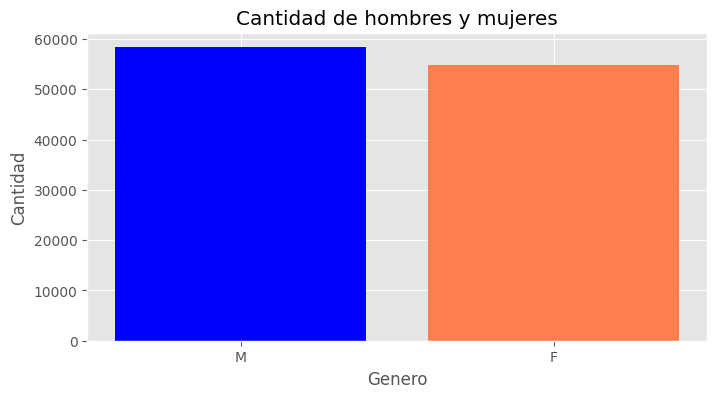

In [14]:
fig, ax = plt.subplots(figsize=(8,4))
colores = colores = ['b', "coral"]
ax.bar(g.index, g.values, color = colores)
ax.set_title('Cantidad de hombres y mujeres')
ax.set_ylabel('Cantidad')
ax.set_xlabel('Genero')

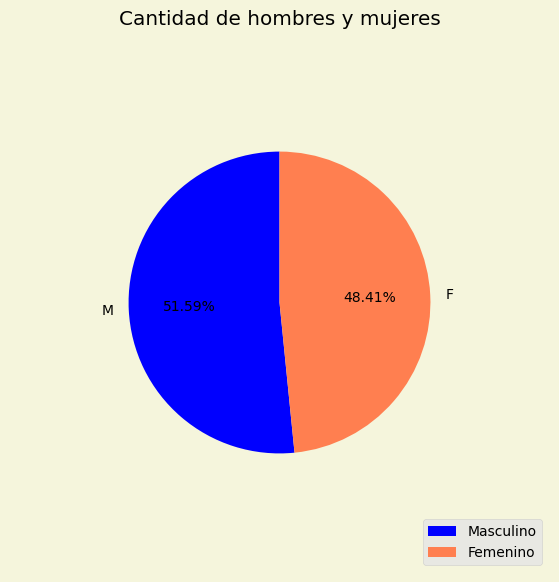

In [15]:
fig,ax = plt.subplots(figsize =(8,7))
nuevas_etiquetas = ['Masculino', 'Femenino']
colores = colores = ['b', 'coral']
fig.set_facecolor('#F5F5DC')
ax.pie(g, labels = g.index,radius=0.7,startangle=90,autopct= "%1.2f%%",colors =  colores)
plt.legend(loc="lower right", labels=nuevas_etiquetas, fontsize=10)
ax.set_title('Cantidad de hombres y mujeres')
plt.show()

In [16]:
cp = df["Product_Category"].value_counts()
cp

,count
Product_Category,
Accessories,70120
Bikes,25982
Clothing,16934


In [17]:
cp.values.sum()

113036

Text(0.5, 0, 'Categoria')

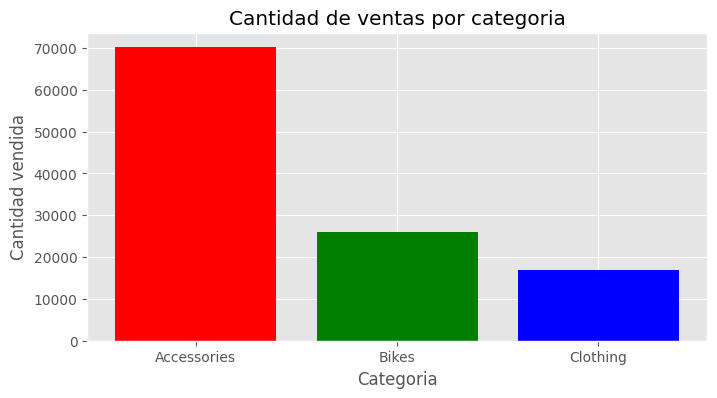

In [18]:
fig, ax = plt.subplots(figsize=(8,4))
colores = colores = ['r', 'g', 'b']
ax.bar(cp.index, cp.values, color = colores)
ax.set_title('Cantidad de ventas por categoria')
ax.set_ylabel('Cantidad vendida')
ax.set_xlabel('Categoria')

In [19]:
scp=df["Sub_Category"].value_counts()
scp

,count
Sub_Category,
Tires and Tubes,33870
Bottles and Cages,15876
Road Bikes,13430
Helmets,12158
Mountain Bikes,8854
Jerseys,6010
Caps,4358
Fenders,4032
Touring Bikes,3698


[Text(0, 0, 'Tires and Tubes'),
 Text(1, 0, 'Bottles and Cages'),
 Text(2, 0, 'Road Bikes'),
 Text(3, 0, 'Helmets'),
 Text(4, 0, 'Mountain Bikes'),
 Text(5, 0, 'Jerseys'),
 Text(6, 0, 'Caps'),
 Text(7, 0, 'Fenders'),
 Text(8, 0, 'Touring Bikes'),
 Text(9, 0, 'Gloves'),
 Text(10, 0, 'Cleaners'),
 Text(11, 0, 'Shorts'),
 Text(12, 0, 'Hydration Packs'),
 Text(13, 0, 'Socks'),
 Text(14, 0, 'Vests'),
 Text(15, 0, 'Bike Racks'),
 Text(16, 0, 'Bike Stands')]

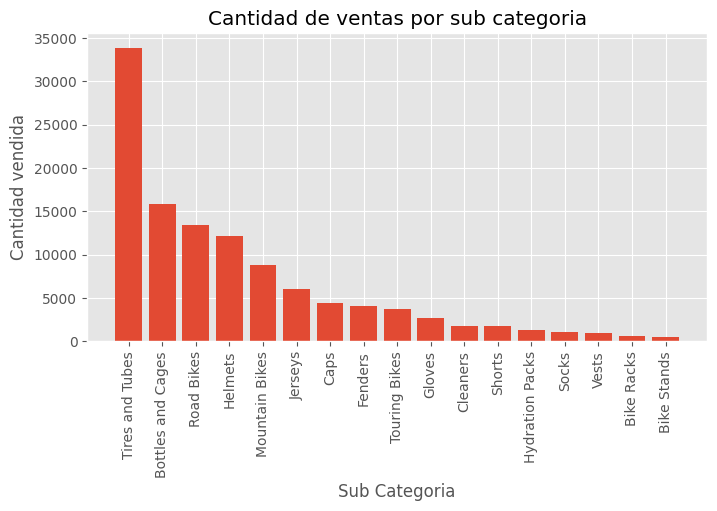

In [20]:
fig, ax = plt.subplots(figsize=(8,4))
ax.bar(scp.index, scp.values)
ax.set_title('Cantidad de ventas por sub categoria')
ax.set_ylabel('Cantidad vendida')
ax.set_xlabel('Sub Categoria')
ax.set_xticklabels(scp.index, rotation=90)

In [21]:
c = df["Country"].value_counts()
c

,count
Country,
United States,39206
Australia,23936
Canada,14178
United Kingdom,13620
Germany,11098
France,10998


Text(0.5, 0, 'Pais')

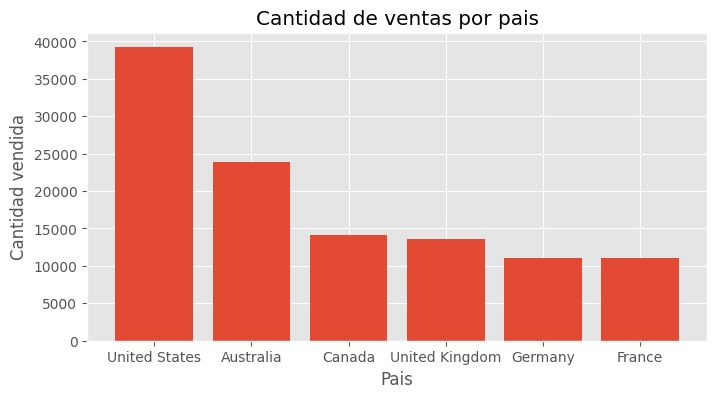

In [22]:
fig, ax = plt.subplots(figsize=(8,4))
ax.bar(c.index, c.values)
ax.set_title('Cantidad de ventas por pais')
ax.set_ylabel('Cantidad vendida')
ax.set_xlabel('Pais')


In [23]:
vxa = df.groupby(['Year'])["Revenue"].sum()
vxa

,Revenue
Year,
2011,8964888
2012,9175983
2013,15240037
2014,14152724
2015,20023991
2016,17713385


Text(0.5, 0, 'Año')

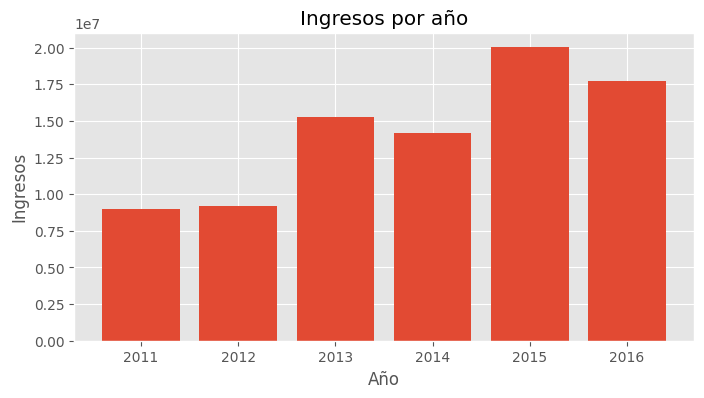

In [24]:
fig, ax = plt.subplots(figsize=(8,4))
ax.bar(vxa.index, vxa.values)
ax.set_title('Ingresos por año')
ax.set_ylabel('Ingresos')
ax.set_xlabel('Año')

#TERCER PASO

---

Primera hipotesis

1) Segun lo que muestra el dataset puede ser que la categoria ("Bikes")fue la que tuvo mayor participacion en los ingresos.

Respuesta : al ver el gafico de barras que se realizo, esta hipotesis es verdadera.


In [25]:
ingresos_por_categoria = df.groupby(['Product_Category'])["Revenue"].sum()
ingresos_por_categoria

,Revenue
Product_Category,
Accessories,15117992
Bikes,61782134
Clothing,8370882


Text(0.5, 1.0, 'ingresos por categoria')

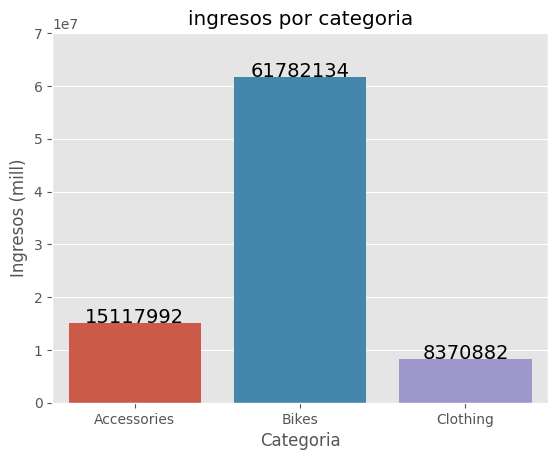

In [26]:
ic=sns.barplot(x = ingresos_por_categoria.index, y = ingresos_por_categoria, hue = ingresos_por_categoria.index , errorbar=None)
for i, v in enumerate(ingresos_por_categoria):
   ic.text(i, v + 0.2, str(v), ha='center', color='black', fontsize=14)
plt.xlabel('Categoria')
plt.ylabel('Ingresos (mill)')
plt.ylim(0, 70000000)
plt.title("ingresos por categoria")


------------------------------------------------------
Segunda hipotesis

2) Si es verdadera la primera hipotesis, se podria decir que, en base a sub categorias tambien lo relacionado a ("bikes") tuvo mayor participacion en ingresos.

Respuesta : esta hipotesis es verdadera, ya que las bicicletas vendidas son las mas caras, por ende, aumento lo ingresos.(2-B)

In [27]:
ingresos_por_subcategoria = df.groupby(["Sub_Category"])["Revenue"].sum().sort_values(ascending = False )
ingresos_por_subcategoria

,Revenue
Sub_Category,
Road Bikes,33363061
Mountain Bikes,21123526
Touring Bikes,7295547
Helmets,5741081
Tires and Tubes,4670902
Jerseys,4113742
Shorts,1740710
Bottles and Cages,1409174
Fenders,1245733


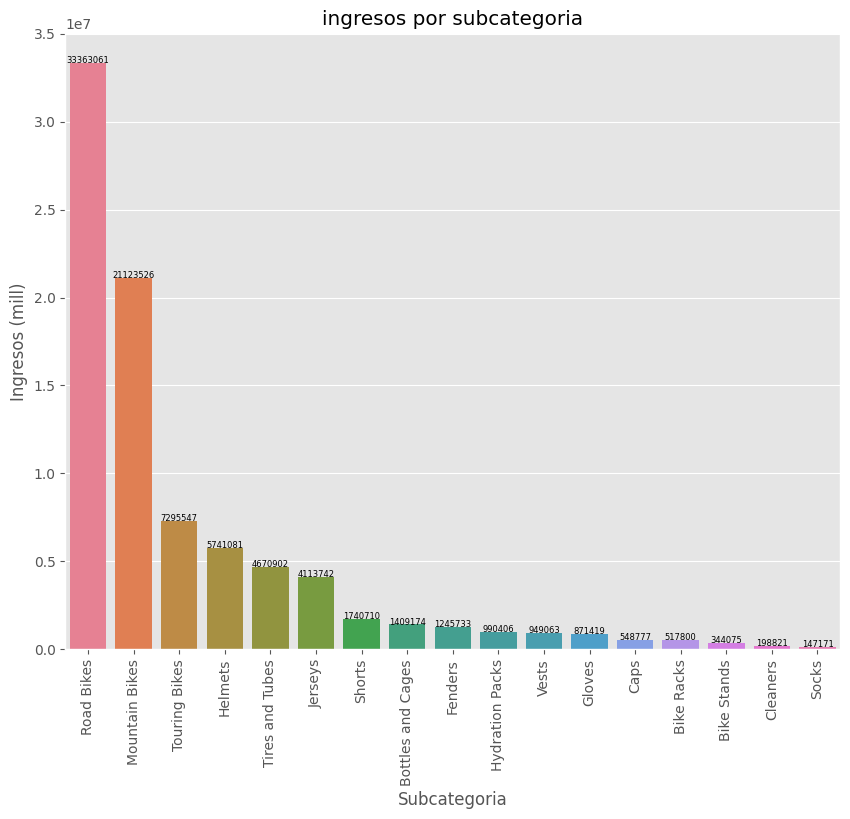

In [28]:
plt.figure(figsize=(10, 8))
isu=sns.barplot(x = ingresos_por_subcategoria.index, y = ingresos_por_subcategoria, hue = ingresos_por_subcategoria.index , errorbar=None)
for i, v in enumerate(ingresos_por_subcategoria):
   isu.text(i, v + 0.2, str(v), ha='center', color='black', fontsize=6)
plt.xlabel('Subcategoria')
plt.ylabel('Ingresos (mill)')
plt.xticks(rotation=90)

plt.title("ingresos por subcategoria")
plt.show()

------------------------------------------------------
Tercera hipotesis

3) Si en sub categorias, lo relacionado a ("bikes") tuvo mayo participacion, eso quiere decir que fue la mas vendida.

Respuesta : es falso, al comparar lo dos graficos hechos, se advierte que las bicicletas aunque fueron las que mas aportaron en los ingresos durante un periodo de tiempo, no fueron las mas vendidas sino que ese lugar lo ocuparon los productos relacionados con ("Accessories")

In [29]:
nuevo_data = df[["Year","Sub_Category","Revenue"]].groupby(by=["Year","Sub_Category"]).sum().reset_index()
nuevo_data

,Year,Sub_Category,Revenue
0,2011,Mountain Bikes,2198270
1,2011,Road Bikes,6766618
2,2012,Mountain Bikes,2182853
3,2012,Road Bikes,6993130
4,2013,Bike Racks,112605
...,...,...,...
67,2016,Shorts,423855
68,2016,Socks,40516
69,2016,Tires and Tubes,1296355
70,2016,Touring Bikes,2457126


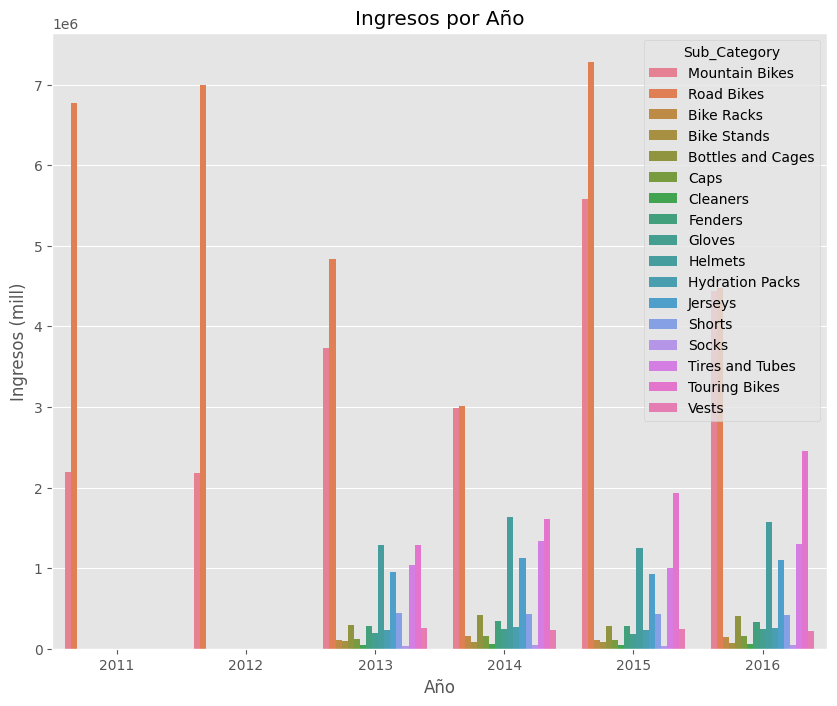

In [30]:
plt.figure(figsize=(10,8))
sns.barplot(data=nuevo_data,x = "Year", y= "Revenue", hue="Sub_Category",errorbar=None)
plt.xlabel('Año')
plt.ylabel('Ingresos (mill)')
plt.title("Ingresos por Año")
plt.show()

In [31]:
nuevo_data2 = df[["Year","Sub_Category","Order_Quantity"]].groupby(by=["Year","Sub_Category"]).count().reset_index()
nuevo_data2

,Year,Sub_Category,Order_Quantity
0,2011,Mountain Bikes,615
1,2011,Road Bikes,2062
2,2012,Mountain Bikes,615
3,2012,Road Bikes,2062
4,2013,Bike Racks,137
...,...,...,...
67,2016,Shorts,462
68,2016,Socks,313
69,2016,Tires and Tubes,9656
70,2016,Touring Bikes,1024


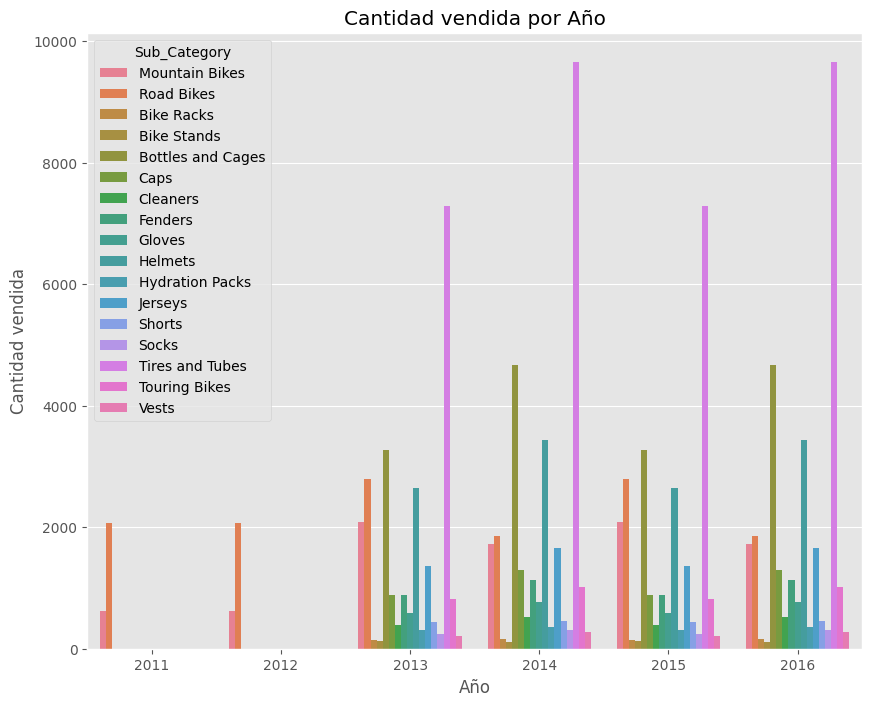

In [32]:
plt.figure(figsize=(10,8))
sns.barplot(data= nuevo_data2,x = "Year", y= "Order_Quantity", hue="Sub_Category",errorbar=None)
plt.xlabel('Año')
plt.ylabel('Cantidad vendida')
plt.title("Cantidad vendida por Año")
plt.show()

------------------------------------------------------
Cuarta hipotesis

4) Los adultos mayores (Entre 30 y 40 años ) son los que mas compras hicieron.

Respuesta: segun lo que muestra el grafico, no solo ese rango es el que tiene mas compras, sino que en realidad esta distribuido en un rango de (25 a 35 años) y que el genero masculino levemente es el que mas compras hace como se habia visto en el "SEGUNDO PASO".

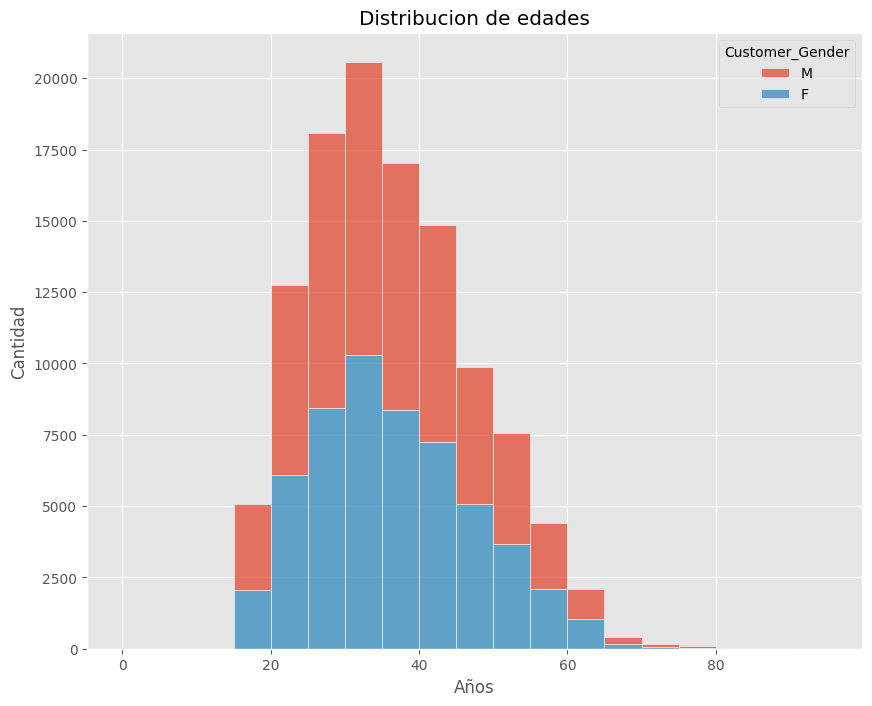

In [33]:
plt.figure(figsize=(10, 8))
# Axes-level
bin_width = 5
bin_range = range(0, 100, bin_width)
az=sns.histplot(data=df, x="Customer_Age", hue="Customer_Gender", multiple="stack",bins=bin_range)
az.set_xlabel("Años")
az.set_ylabel("Cantidad")
az.set_title("Distribucion de edades")
plt.show()

------------------------------------------------------
Quinta hipotesis

5)El mes que mas ingresos tuvo fue el de diciembre.

Respuesta : hipotesis correcta, no solo fue el mes de diciembre sino que tambien fue el mes de junio, lo que da a entender que en diciembre se incrementaron las ventas por las fiestas navideñas y en junio por las vacaciones de verano.

In [34]:
ingresos_por_mes = df.groupby(['Month'])['Revenue'].sum().sort_values(ascending = False )
ingresos_por_mes

,Revenue
Month,
December,9086931
June,9043008
May,8836763
April,7602750
March,7347164
January,7005895
February,6834583
November,6244298
October,5995079


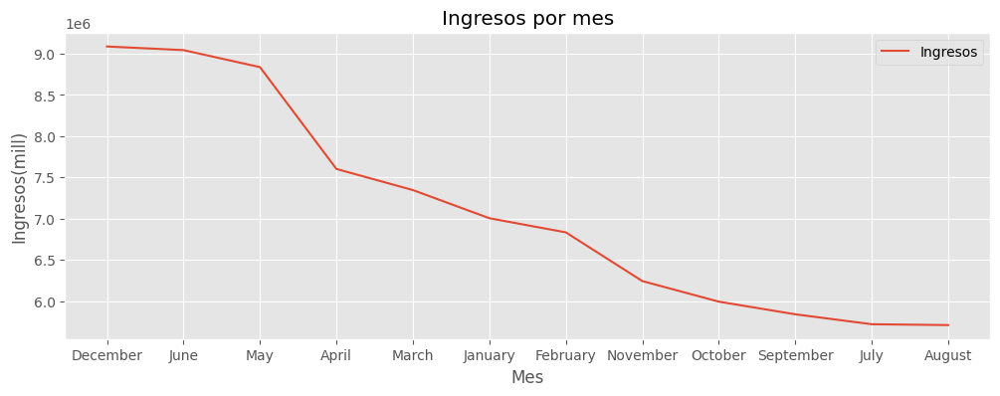

In [35]:
fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(ingresos_por_mes.index, ingresos_por_mes, label='Ingresos')
ax.set_xlabel('Mes')
ax.set_ylabel('Ingresos(mill)')
ax.set_title('Ingresos por mes')
ax.legend()

------------------------------------------------------
Sexta hipotesis

6)¿Cual fue el producto que mas ingresos genero?

Respuesta : El producto que mas ingreso genero es ("Road-150 Red, 62") pero comprandolo en EE.UU que fue el pais que mas ventas tuvo , este producto se encuentra en la cuarta posicion, dando a entender que habria que promocionar mas esta bicicleta en este pais.

In [36]:
nuevo_data3 = df[["Product","Product_Category","Revenue"]].groupby(by=["Product","Product_Category"]).sum().reset_index().sort_values(by = "Revenue",ascending = False)
nuevo_data3

,Product,Product_Category,Revenue
63,"Road-150 Red, 62",Bikes,3829416
34,"Mountain-200 Black, 38",Bikes,3366248
61,"Road-150 Red, 52",Bikes,3180840
62,"Road-150 Red, 56",Bikes,3158805
38,"Mountain-200 Silver, 42",Bikes,3081078
...,...,...,...
52,"Mountain-500 Silver, 48",Bikes,25794
48,"Mountain-500 Black, 52",Bikes,19287
8,Fender Set - Mountain,Clothing,635
0,AWC Logo Cap,Accessories,459


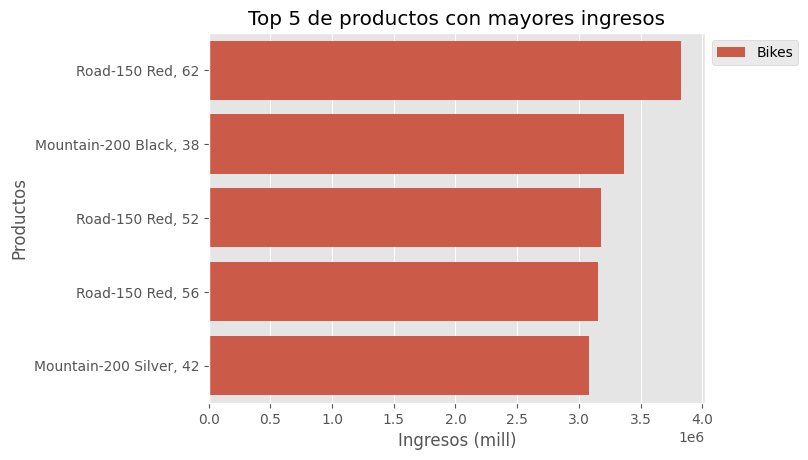

In [37]:
gr = sns.barplot(data=nuevo_data3.head(5), x="Revenue", y="Product", hue = "Product_Category")
gr.legend(loc="upper left", bbox_to_anchor=(1, 1))
gr.set_xlabel("Ingresos (mill)")
gr.set_ylabel("Productos")
gr.set_title("Top 5 de productos con mayores ingresos")
plt.show()

In [38]:
nuevo_data4 = df[["Country","Product","Revenue"]].groupby(by=["Country","Product"]).sum().reset_index().sort_values(by = "Revenue",ascending = False)
nuevo_data4

,Country,Product,Revenue
673,United States,"Road-150 Red, 48",1417666
674,United States,"Road-150 Red, 52",1385411
61,Australia,"Road-150 Red, 62",1344402
652,United States,"Mountain-200 Silver, 42",1246182
676,United States,"Road-150 Red, 62",1196887
...,...,...,...
539,United Kingdom,"Mountain-500 Black, 48",1555
320,France,"Road-650 Black, 48",1504
454,Germany,"Road-650 Black, 62",1362
172,Canada,"Mountain-500 Silver, 48",1118


In [39]:
us_data = nuevo_data4[nuevo_data4["Country"] == "United States"]
us_data

,Country,Product,Revenue
673,United States,"Road-150 Red, 48",1417666
674,United States,"Road-150 Red, 52",1385411
652,United States,"Mountain-200 Silver, 42",1246182
676,United States,"Road-150 Red, 62",1196887
650,United States,"Mountain-200 Black, 46",1167160
...,...,...,...
732,United States,"Touring-3000 Blue, 50",4911
700,United States,"Road-650 Red, 44",3836
696,United States,"Road-650 Black, 52",3054
702,United States,"Road-650 Red, 52",2694


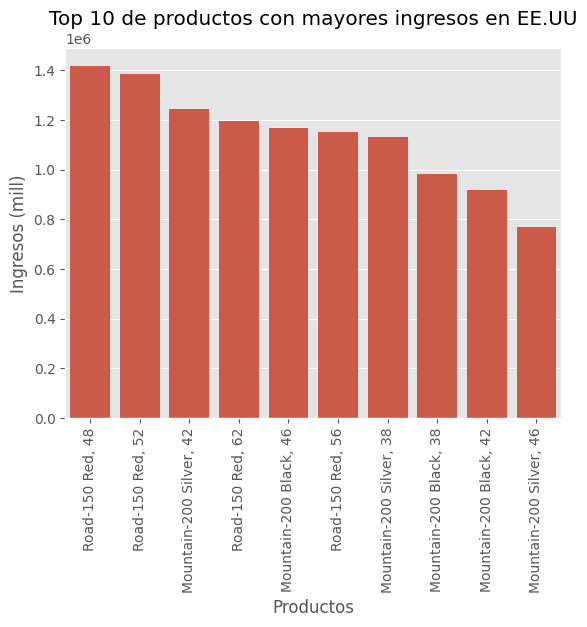

In [40]:
pi = sns.barplot(data=us_data.head(10), x="Product", y="Revenue")
labels = pi.get_xticklabels()
pi.set_xticklabels(labels, rotation=90)
pi.set_xlabel("Productos")
pi.set_ylabel("Ingresos (mill)")
pi.set_title("Top 10 de productos con mayores ingresos en EE.UU")
plt.show()

--------------------------------------------
Septima hipotesis

7) Existe una relacion directa entre ingresos("Revenue") y ganancias("Profit").

Respuesta : es verdadera, existe una relacion directa pero al realizar el grafico se encuntran valores atipicos que luego se van a analizar.

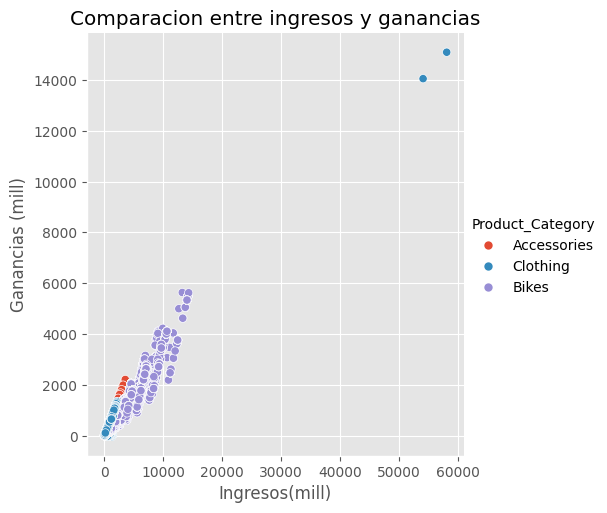

In [41]:
sns.relplot(data=df, x="Revenue", y="Profit", hue="Product_Category", kind="scatter")
plt.xlabel('Ingresos(mill)')
plt.ylabel('Ganancias (mill)')
plt.title("Comparacion entre ingresos y ganancias")
plt.show()

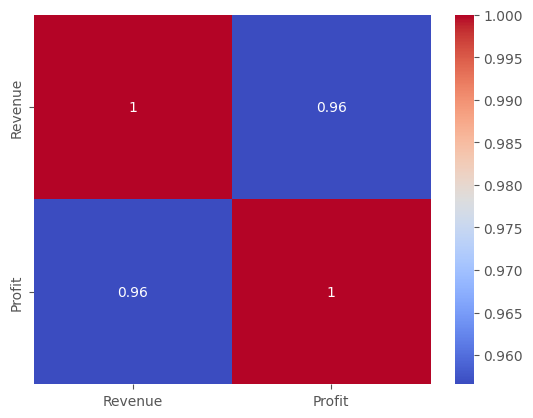

In [42]:
columnas_seleccionadas = df[['Revenue', 'Profit']]
matriz_correlacion = columnas_seleccionadas.corr()
sns.heatmap(matriz_correlacion, cmap='coolwarm', annot=True)
plt.show()

#CUARTO PASO - BUSQUEDA DE OUTLIERS

Al haber analizado una hipotesis en un grafico de dispercion (7-G) nos encontramos con varios valores outliers, se lo vuelve a analizar en un grafico boxplot y se termina confirmando que estos valores se encuentran en el año 2013 y 2015 y ambos son de la categoria ("Clothing"), para tener una mejor idea de a quien pertenece, se lo analizo por genero y pertenece al masculino. Recomendacion: A mi parecer recomiendo eliminar por lo menos los dos valores mas extremos que son mayores a 50000 en ingresos, ya que son muy elevados y podrian estar arruinando todo el analisis.


---


Text(0.5, 1.0, 'Ingresos por Año')

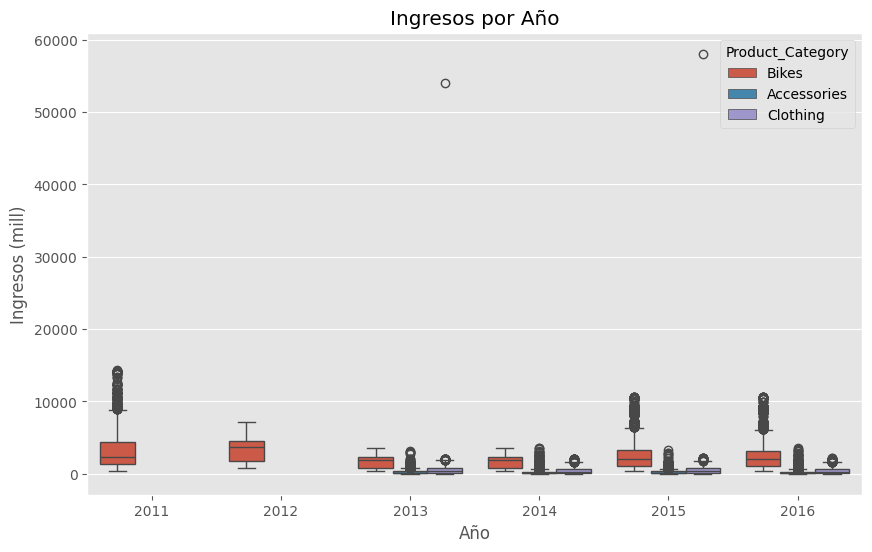

In [43]:
plt.figure(figsize=(10,6))
ax = sns.boxplot(x=df.Year, y=df.Revenue, data=df, hue = df.Product_Category)
plt.xlabel('Año')
plt.ylabel('Ingresos (mill)')
plt.title("Ingresos por Año")

Text(0.5, 1.0, 'Ingresos por genero')

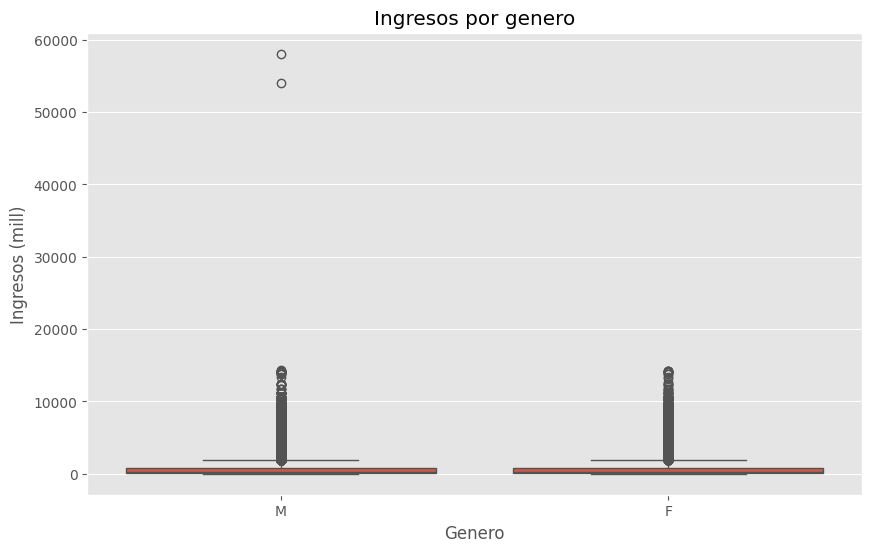

In [44]:
plt.figure(figsize=(10,6))
sns.boxplot(x=df.Customer_Gender, y= df.Revenue)
plt.xlabel('Genero')
plt.ylabel('Ingresos (mill)')
plt.title("Ingresos por genero")

In [45]:
valor_max = df["Revenue"].quantile(0.75) + 1.5*(df["Revenue"].quantile(0.75)-df["Revenue"].quantile(0.25))
valor_max

1905.5

In [46]:
outliers = df["Revenue"][df["Revenue"]>valor_max].sort_values(ascending = False )
outliers

,Revenue
112073,58074
112072,54069
71129,14312
68671,14169
70699,14169
...,...
59410,1906
58953,1906
58952,1906
58951,1906


In [47]:
df[df["Revenue"] > 50000]

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
112072,2013-07-24,24,July,2013,52,Adults (35-64),M,Australia,Queensland,Clothing,Vests,"Touring-1000 Yellow, 50",27,1482,2384,14055,40014,54069
112073,2015-07-24,24,July,2015,52,Adults (35-64),M,Australia,Queensland,Clothing,Vests,"Touring-1000 Yellow, 50",29,1482,2384,15096,42978,58074


#QUINTO PASO - ANALISIS DESCRIPTIVO

Analizando el graficos y los datos que obtuvimos de ("Revenue"), nos damos cuenta que los datos estan demasiados dispersos, por lo tanto la media no es muy representativa que digamos, podria cambiar si se eliminan los dos valores extremos de los outliers.
En cambio, en ("Customer_Age") es todo lo contraio, los datos estan mas agrupados, y se podria decir que son mas homogeneos.

---

In [48]:
print(df['Revenue'].mean().round(1))
print(round(df['Revenue'].median(), 1))

754.4
223.0


<Axes: >

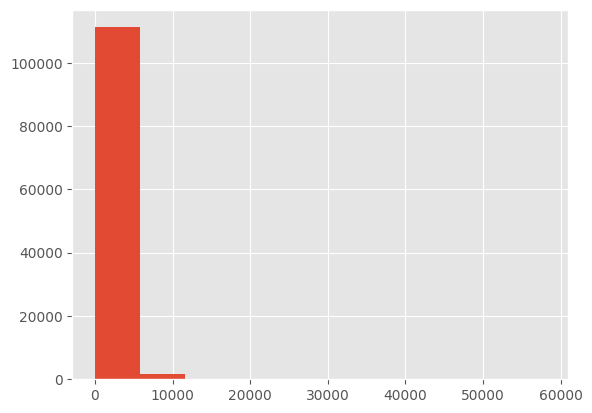

In [49]:
df['Revenue'].hist()

In [50]:
round(df['Revenue'].std(), 1)

1309.1

In [51]:
df['Revenue'].mean().round(1)

754.4

In [52]:
coef_var = (df["Revenue"].std() / df['Revenue'].mean()) *100
coef_var

173.53474409121586

In [53]:
print(df['Customer_Age'].mean().round(1))
print(round(df['Customer_Age'].median(), 1))

35.9
35.0


<Axes: >

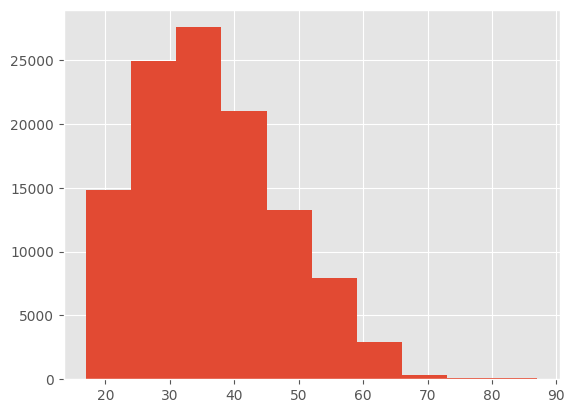

In [54]:
df['Customer_Age'].hist()

In [55]:
round(df['Customer_Age'].std(), 1)

11.0

In [56]:
df['Customer_Age'].mean().round(1)

35.9

In [57]:
coef_var = (df["Customer_Age"].std() / df['Customer_Age'].mean()) *100
coef_var

30.685349536585598

#SEXTO PASO - ELIMINACION DE OUTLIERS
Se procede a eliminar los outliers para poder hacer un analisis mucho mejor y que no afecte de manera negatica los modelos de regresion

In [58]:
#SE ELIMINAN ESTAS DOS FILAS--YA QUE SON OUTLIERS
df[df["Revenue"] > 50000]

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
112072,2013-07-24,24,July,2013,52,Adults (35-64),M,Australia,Queensland,Clothing,Vests,"Touring-1000 Yellow, 50",27,1482,2384,14055,40014,54069
112073,2015-07-24,24,July,2015,52,Adults (35-64),M,Australia,Queensland,Clothing,Vests,"Touring-1000 Yellow, 50",29,1482,2384,15096,42978,58074


In [59]:
#SE PROCEDE A ELIMINARLAS
df.drop(df[df["Revenue"] > 50000].index, inplace=True)
df.reset_index(drop=True, inplace=True)

#Conclusion parcial

Es un dataset bastante completo, de la cual se pueden sacar varias conclusiones:

. En lo que respecta a paises, EE.UU es el que mayor ventas tiene , lo que hace pensar que deberia mejorar su publicidad o hacer una campaña mas agresiva en Europa y Asia y ver que resultados obtuvo en lo futuros años.

. En la parte de ventas por genero, la verdad es que es muy parejo, en todo caso se puede recomendar hacer publicidad o descuentos a productos que sean de uso femenino.

.En lo que hace refencia a ventas de productos, la categoria (Accessories)
 es la que mas ventas realizo pero no que la que mas ingresos genero, es por este motivo que se recomienda hacer un poco mas de presion en la ventas de todo lo que representa (Bikes) y (Clothings)

.Por ultimo, los ingresos por año fueron aumentando hasta el 2015 y luego bajo en el año 2016, se podria relaizar un modelo ara poder predecir si esta tendencia va a seguir o se revierte.

#SEPTIMO PASO - ELECCION DE MODELO
#PRIMER MODELO-REGRESION LINEAL- Años("Year")/Ingresos("Revenue")

PRIMER MODELO-REGRESION LINEAL- Años("Year")/Ingresos("Revenue")
* Se necesita crear un modelo para predecir cuales seran los ingresos en los años futuros, con todo lo analizado, se vio una tendencia alcista en los ingresos y es importante para la empresa saber como va a seguir esta tendecia.  

  RESPUESTA: este modelo al parecer es bastante inexacto, ya que al ver el resultado de las validaciones nos damos cuenta que faltan muchos mas datos, tanto en el eje x como en el eje y, una vez que se tengan mas años para poder entrenar el modelo, se podria practicarlo de nuevo y ver el resultado.
  Al ver el modelado en regresion multiple, se vieron muchas mejoras pero no son los resultados que se buscan.

In [ ]:
ingresos_por_año = df.groupby(["Year"])["Revenue"].sum().sort_values(ascending = True ).reset_index()
ingresos_por_año

,Year,Revenue
0,2011,8964888
1,2012,9175983
2,2014,14152724
3,2013,15185968
4,2016,17713385
5,2015,19965917


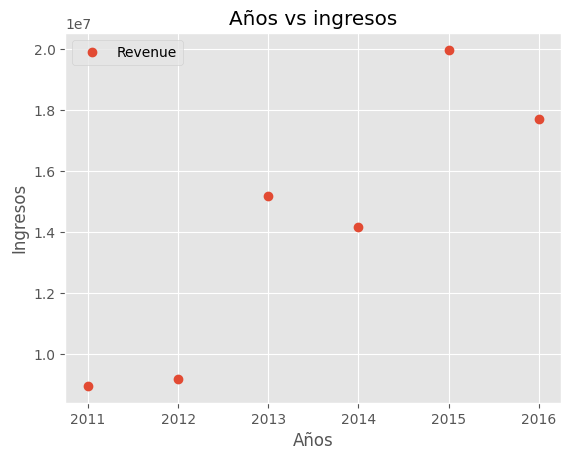

In [ ]:
ingresos_por_año.plot(x='Year', y='Revenue', style="o")
plt.title('Años vs ingresos')
plt.xlabel('Años')
plt.ylabel('Ingresos')
plt.show()

In [ ]:
# Calcular el coeficiente de correlación entre X e Y
corr_coeff =ingresos_por_año['Year'].corr(ingresos_por_año['Revenue'], method='pearson')

# Imprimir el coeficiente de correlación
print("Coeficiente de correlación de Pearson: ", corr_coeff)

Coeficiente de correlación de Pearson:  0.900927837206947


In [ ]:
X1 = ingresos_por_año[["Year"]]
X1

,Year
0,2011
1,2012
2,2014
3,2013
4,2016
5,2015


In [ ]:
y1 = ingresos_por_año[["Revenue"]]
y1

,Revenue
0,8964888
1,9175983
2,14152724
3,15185968
4,17713385
5,19965917


In [ ]:
#70% para entrenar y 30% para testear
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size= 0.3, random_state=0)

In [ ]:
regressor = LinearRegression()
regressor.fit(X1_train, y1_train)

LinearRegression()

VALIDACION: SE PRUEBA CON (MAE) Y (R2)

In [ ]:
y1_pred_train = regressor.predict(X1_train)

In [ ]:
y1_pred = regressor.predict(X1_test)

In [ ]:
print("MAE",mean_absolute_error(y1_train,y1_pred_train))

MAE 1212956.0


In [ ]:
print("MAE",mean_absolute_error(y1_test,y1_pred))

MAE 1976796.6428573132


In [ ]:
r2 = r2_score(y1_train,y1_pred_train)
print(r2)

0.8395016801116567


In [ ]:
r2 = r2_score(y1_test,y1_pred)
print(r2)

0.26761422818890346


-------------LOOCV------------------------

In [ ]:
# instanciamos el procediemiento LOOCV
cv = LeaveOneOut()

In [ ]:
# evaluar el modelo (criterio de comparacion MAE)
from sklearn.metrics import mean_squared_error,  make_scorer, mean_absolute_error

MAE = make_scorer(mean_absolute_error)

scores = cross_val_score(regressor, X1, y1, scoring=MAE, cv=cv, error_score='raise',verbose=1)
# convertir a postivos
scores = abs(scores)

# reportar el performance
print('MAE: %.3f std: (%.3f)' % (mean(scores), std(scores)))

MAE: 2368538.491 std: (1242366.791)


SE OBTIENE LA PENDIENTE Y LA INTERCEPCION

In [ ]:
# Obtener la pendiente
slope = regressor.coef_

# Obtener los coeficientes de intercepción
intercept = regressor.intercept_

print("este es el valor de la pendiente:", slope.round(1))
print("este es el valor del intercepto:", intercept.round(1))

este es el valor de la pendiente: [[1859599.7]]
este es el valor del intercepto: [-3.73061417e+09]


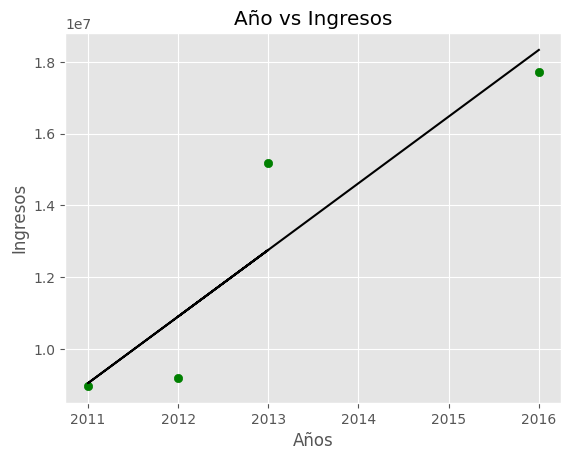

In [ ]:
viz_train = plt
viz_train.scatter(X1_train, y1_train, color = 'g')
viz_train.plot(X1_train, regressor.predict(X1_train), color = 'black')
viz_train.title('Año vs Ingresos')
viz_train.xlabel('Años')
viz_train.ylabel('Ingresos')
viz_train.show()

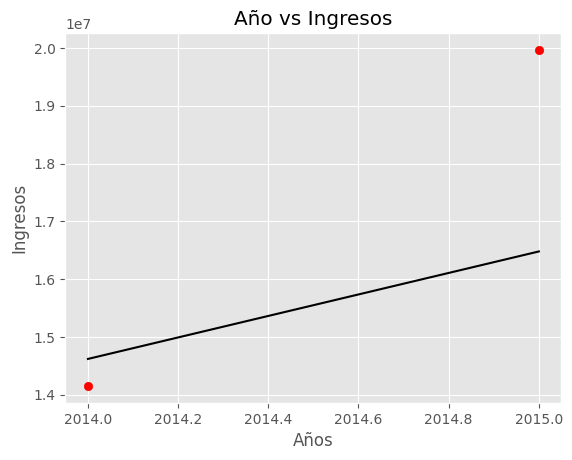

In [ ]:
viz_test = plt
viz_test.scatter(X1_test, y1_test, color = 'red')
viz_test.plot(X1_test, regressor.predict(X1_test), color = 'black')
viz_train.title('Año vs Ingresos')
viz_train.xlabel('Años')
viz_train.ylabel('Ingresos')
viz_test.show()

In [ ]:
y_pred = regressor.predict(X1_test)
y_pred.round(0)

array([[16479255.],
       [14619656.]])

In [ ]:
y1_test

,Revenue
5,19965917
2,14152724


In [ ]:
X1_test

,Year
5,2015
2,2014


In [ ]:
regressor.score(X1_train, y1_train)

0.8395016801116567

In [ ]:
regressor.score(X1_test, y1_test)

0.26761422818890346

In [ ]:
#Input para ingresar la edad que tiene el usuario
Año_ingreso = int(input('Ingrese el año '))

#Predicción del salario que estaria ganando la persona segun la edad digitada.
user_revenue = regressor.predict(np.array([Año_ingreso]).reshape(-1, 1))
#user_salary = regressor.predict([age_experience])

#Se convierte la prediccion del salario en entero para no trabajar con decimales
user_revenue = int(user_revenue)
user_revenue

Ingrese el año 2018


22058054

Regresion multiple

In [83]:
df.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [81]:
X11 = df[['Order_Quantity', 'Unit_Cost', 'Unit_Price','Profit', "Cost"]]
y11 = df['Revenue']

In [84]:
from sklearn.model_selection import train_test_split
X11_train, X11_test, y11_train, y11_test = train_test_split(X11, y11, test_size=0.3, random_state=42)

In [85]:
#Entrenamiento del modelo
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X11_train, y11_train)

LinearRegression()

In [86]:
regressor.coef_

array([-6.03222229e-14, -7.66053887e-15,  4.32986980e-15,  1.00000000e+00,
        1.00000000e+00])

In [87]:
X11.columns

Index(['Order_Quantity', 'Unit_Cost', 'Unit_Price', 'Profit', 'Cost'], dtype='object')

In [88]:
coeff_df = pd.DataFrame(regressor.coef_, X11.columns, columns=['Coefficient'])
coeff_df

,Coefficient
Order_Quantity,-6.032222e-14
Unit_Cost,-7.660539e-15
Unit_Price,4.329870e-15
Profit,1.000000e+00
Cost,1.000000e+00


In [89]:
y11_pred = regressor.predict(X11_test)
y11_pred

array([292., 753., 412., ..., 681.,  88.,  39.])

In [90]:
y11_test

,Revenue
106739,292
30758,753
40669,412
53764,1949
36840,658
...,...
64657,3293
65182,997
69749,681
4795,88


In [91]:
df11 = pd.DataFrame({'Actual': y11_test, 'Predicted': y11_pred})
df11['Sesgo']=df11.Actual -df11.Predicted
df11['Error_porc']=((df11.Actual -df11.Predicted)/df11.Actual) *100
df11

,Actual,Predicted,Sesgo,Error_porc
106739,292,292.0,-5.115908e-13,-1.752023e-13
30758,753,753.0,6.821210e-13,9.058712e-14
40669,412,412.0,-5.684342e-13,-1.379695e-13
53764,1949,1949.0,4.547474e-13,2.333234e-14
36840,658,658.0,2.273737e-13,3.455527e-14
...,...,...,...,...
64657,3293,3293.0,3.183231e-12,9.666661e-14
65182,997,997.0,0.000000e+00,0.000000e+00
69749,681,681.0,-6.821210e-13,-1.001646e-13
4795,88,88.0,-7.105427e-13,-8.074349e-13


#SEGUNDO MODELO-REGRESION LINEAL- Ingresos("Revenue")/Ganancias("Profit")
* Crear un modelo en el que se pueda predecir cuales seran la ganancias("Profit") con solo ingresar el monto total vendido("Revenue").

 RESPUESTA: al realizar este modelo se puede decir que dio un buen resultado, tanto en las validaciones como el el modelo de regresion multiple.

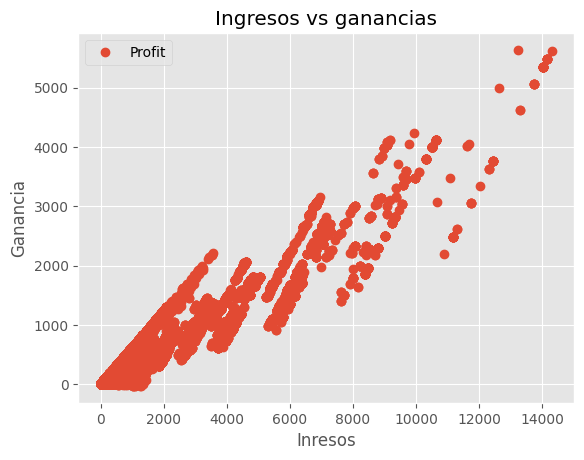

In [ ]:
df.plot(x='Revenue', y='Profit', style="o")
plt.title('Ingresos vs ganancias')
plt.xlabel('Inresos')
plt.ylabel('Ganancia')
plt.show()

In [ ]:
# Calcular el coeficiente de correlación entre X e Y
corr_coeff =df['Revenue'].corr(df['Profit'], method='pearson')

# Imprimir el coeficiente de correlación

print("Coeficiente de correlación de Pearson: ", corr_coeff)

Coeficiente de correlación de Pearson:  0.9565549949031821


In [ ]:
X2 = df[['Revenue']]

y2 = df[['Profit']]

In [ ]:
#70% para entrenar y 30% para testear
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size= 0.3, random_state=0)

In [ ]:
regressor = LinearRegression()
regressor.fit(X2_train, y2_train)

LinearRegression()

VALIDACION: SE PRUEBA CON (MAE) Y (R2)

In [ ]:
y2_pred_train = regressor.predict(X2_train)

In [ ]:
y2_pred = regressor.predict(X2_test)

In [ ]:
print("MAE",mean_absolute_error(y2_train,y2_pred_train))

MAE 79.24503479904305


In [ ]:
print("MAE",mean_absolute_error(y2_test,y2_pred))

MAE 79.07363877269592


In [ ]:
r2 = r2_score(y2_train,y2_pred_train)
print(r2)

0.9135871501102186


In [ ]:
r2 = r2_score(y2_test,y2_pred)
print(r2)

0.9181600727272177


-------------LOOCV------------------------

In [ ]:
# instanciamos el procediemiento LOOCV
cv = LeaveOneOut()

In [ ]:
# evaluar el modelo (criterio de comparacion MAE)
from sklearn.metrics import mean_squared_error,  make_scorer, mean_absolute_error

MAE = make_scorer(mean_absolute_error)

scores = cross_val_score(regressor, X2, y2, scoring=MAE, cv=cv, error_score='raise',verbose=1)
# convertir a postivos
scores = abs(scores)

# reportar el performance
print('MAE: %.3f std: (%.3f)' % (mean(scores), std(scores)))

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   13.3s
[Parallel(n_jobs=1)]: Done 2449 tasks      | elapsed:   18.4s
[Parallel(n_jobs=1)]: Done 3199 tasks      | elapsed:   23.5s
[Parallel(n_jobs=1)]: Done 4049 tasks      | elapsed:   29.6s
[Parallel(n_jobs=1)]: Done 4999 tasks      | elapsed:   36.4s
[Parallel(n_jobs=1)]: Done 6049 tasks      | elapsed:   43.4s
[Parallel(n_jobs=1)]: Done 7199 tasks      | elapsed:   51.5s
[Parallel(n_jobs=1)]: Done 8449 tasks      | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done 9799 tasks      | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done 11249 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done 12799 tasks      | elapsed:  1.5min
[Parallel(

MAE: 79.027 std: (104.700)


SE OBTIENE LA PENDIENTE Y LA INTERCEPCION

In [ ]:
# Obtener la pendiente
slope = regressor.coef_

# Obtener los coeficientes de intercepción
intercept = regressor.intercept_

print("este es el valor de la pendiente:", slope.round(1))
print("este es el valor del intercepto:", intercept.round(1))

este es el valor de la pendiente: [[0.3]]
este es el valor del intercepto: [33.7]


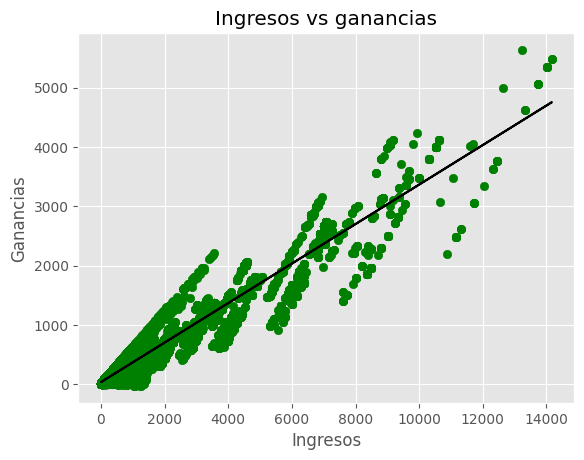

In [ ]:
viz_train = plt
viz_train.scatter(X2_train, y2_train, color = 'g')
viz_train.plot(X2_train, regressor.predict(X2_train), color = 'black')
viz_train.title("Ingresos vs ganancias")
viz_train.xlabel('Ingresos')
viz_train.ylabel('Ganancias')
viz_train.show()

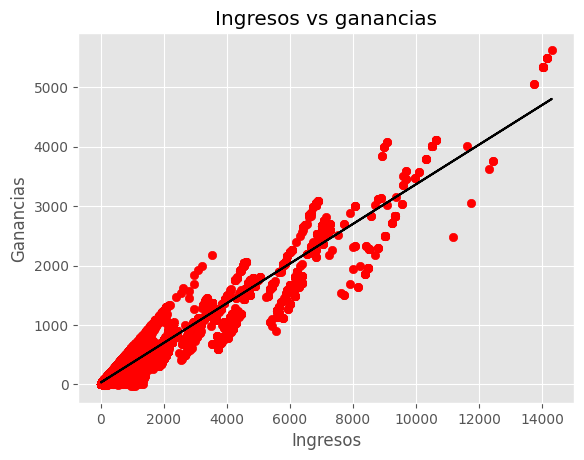

In [ ]:
viz_test = plt
viz_test.scatter(X2_test, y2_test, color = 'red')
viz_test.plot(X2_test, regressor.predict(X2_test), color = 'black')
viz_test.title("Ingresos vs ganancias")
viz_test.xlabel('Ingresos')
viz_test.ylabel('Ganancias')
viz_test.show()

In [ ]:
y2_pred = regressor.predict(X2_test)
y2_pred.round(0)

array([[ 39.],
       [ 65.],
       [148.],
       ...,
       [220.],
       [ 78.],
       [108.]])

In [ ]:
y2_test

,Profit
103062,8
16514,46
39581,213
76651,13
61796,484
...,...
23043,111
22191,108
99354,350
18594,27


In [ ]:
regressor.score(X2_train, y2_train)

0.9135871501102186

In [ ]:
regressor.score(X2_test, y2_test)

0.9181600727272177

In [ ]:
#Input para ingresar la edad que tiene el usuario
Revenue_profit = float(input('Ingreso en usd. '))

#Predicción del salario que estaria ganando la persona segun la edad digitada.
user_Profit = regressor.predict(np.array([Revenue_profit]).reshape(-1, 1))
#user_salary = regressor.predict([Revenue_profit])

#Se convierte la prediccion del salario en entero para no trabajar con decimales
user_Profit = int(user_Profit)
print("Ganancia: ",user_Profit)

Ingreso en usd. 35000
Ganancia:  11699


Regresion multiple

In [ ]:
df.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [ ]:
X22 = df[['Order_Quantity', 'Unit_Cost', 'Unit_Price','Cost', "Revenue"]]
y22 = df['Profit']

In [ ]:
from sklearn.model_selection import train_test_split
X22_train, X22_test, y22_train, y22_test = train_test_split(X22, y22, test_size=0.3, random_state=42)

In [ ]:
#Entrenamiento del modelo
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X22_train, y22_train)

LinearRegression()

In [ ]:
regressor.coef_

array([-8.82323515e-14,  8.32667268e-17, -6.66133815e-16, -1.00000000e+00,
        1.00000000e+00])

In [ ]:
X22.columns

Index(['Order_Quantity', 'Unit_Cost', 'Unit_Price', 'Cost', 'Revenue'], dtype='object')

In [ ]:
coeff_df = pd.DataFrame(regressor.coef_, X22.columns, columns=['Coefficient'])
coeff_df

,Coefficient
Order_Quantity,-8.823235e-14
Unit_Cost,8.326673e-17
Unit_Price,-6.661338e-16
Cost,-1.000000e+00
Revenue,1.000000e+00


In [ ]:
y22_pred = regressor.predict(X22_test)
y22_pred

array([164., 428., 256., ..., 194.,  52.,  23.])

In [ ]:
y22_test

,Profit
106740,164
30758,428
40669,256
53764,683
36840,411
...,...
64657,1154
65182,284
69749,194
4795,52


In [ ]:
df22 = pd.DataFrame({'Actual': y22_test, 'Predicted':  y22_pred})
df22['Sesgo']=df22.Actual -df22.Predicted
df22['Error_porc']=((df22.Actual -df22.Predicted)/df22.Actual) *100
df22

,Actual,Predicted,Sesgo,Error_porc
106740,164,164.0,0.000000e+00,0.000000e+00
30758,428,428.0,6.252776e-13,1.460929e-13
40669,256,256.0,-4.547474e-13,-1.776357e-13
53764,683,683.0,5.684342e-13,8.322609e-14
36840,411,411.0,1.136868e-13,2.766103e-14
...,...,...,...,...
64657,1154,1154.0,0.000000e+00,0.000000e+00
65182,284,284.0,-2.842171e-13,-1.000764e-13
69749,194,194.0,-5.968559e-13,-3.076577e-13
4795,52,52.0,1.989520e-13,3.825999e-13


#TERCER MODELO-REGRESION LINEAL- Ingresos("Revenue")/Costo("Cost")
* Crear un modelo en el que se pueda predecir cual sera el costo("Cost") aproximado con solo ingresar el monto total vendido("Revenue")  

  RESPUESTA(esta respuesta abarca estos ultmos dos modelos): viendo los resultados de ambos tanto el final como el de correalacion y el de validacion , se puede decir que este modelo esta bien realizado para su uso, con lo cual, esta teniendo una buena prediccion.
  Hay que aclarar tambien que el modelo de regesion multiple dio un buen resulatado

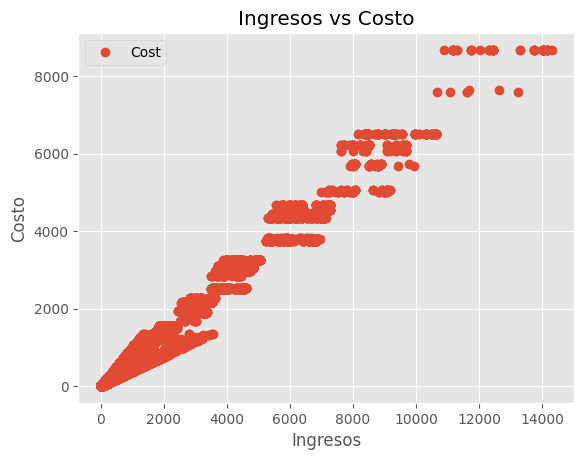

In [ ]:
df.plot(x='Revenue', y='Cost', style="o")
plt.title('Ingresos vs Costo')
plt.xlabel('Ingresos')
plt.ylabel('Costo')
plt.show()

In [ ]:
# Calcular el coeficiente de correlación entre X e Y
corr_coeff =df['Revenue'].corr(df['Cost'], method='pearson')

# Imprimir el coeficiente de correlación

print("Coeficiente de correlación de Pearson: ", corr_coeff)

Coeficiente de correlación de Pearson:  0.988512821542791


In [ ]:
X3 = df[['Revenue']]

y3 = df[['Cost']]

In [ ]:
#70% para entrenar y 30% para testear
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size= 0.3, random_state=0)

In [ ]:
regressor = LinearRegression()
regressor.fit(X3_train, y3_train)

LinearRegression()

VALIDACION: SE PRUEBA CON (MAE) Y (R2)

In [ ]:
y3_pred = regressor.predict(X3_test)

In [ ]:
y3_pred_train = regressor.predict(X3_train)

In [ ]:
print("MAE",mean_absolute_error(y3_train,y3_pred_train))

MAE 79.24503479904304


In [ ]:
print("MAE",mean_absolute_error(y3_test,y3_pred))

MAE 79.07363877269592


In [ ]:
r2 = r2_score(y3_train,y3_pred_train)
print(r2)

0.9769020864127979


In [ ]:
r2 = r2_score(y3_test,y3_pred)
print(r2)

0.9777392533353342


-------------LOOCV------------------------

In [ ]:
# instanciamos el procediemiento LOOCV
cv = LeaveOneOut()

In [ ]:
# evaluar el modelo (criterio de comparacion MAE)
from sklearn.metrics import mean_squared_error,  make_scorer, mean_absolute_error

MAE = make_scorer(mean_absolute_error)

scores = cross_val_score(regressor, X3, y3, scoring=MAE, cv=cv, error_score='raise',verbose=1)
# convertir a postivos
scores = abs(scores)

# reportar el performance
print('MAE: %.3f std: (%.3f)' % (mean(scores), std(scores)))

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done 799 tasks      | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done 1249 tasks      | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   12.4s
[Parallel(n_jobs=1)]: Done 2449 tasks      | elapsed:   16.9s
[Parallel(n_jobs=1)]: Done 3199 tasks      | elapsed:   22.1s
[Parallel(n_jobs=1)]: Done 4049 tasks      | elapsed:   28.0s
[Parallel(n_jobs=1)]: Done 4999 tasks      | elapsed:   34.6s
[Parallel(n_jobs=1)]: Done 6049 tasks      | elapsed:   41.9s
[Parallel(n_jobs=1)]: Done 7199 tasks      | elapsed:   49.6s
[Parallel(n_jobs=1)]: Done 8449 tasks      | elapsed:   58.2s
[Parallel(n_jobs=1)]: Done 9799 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 11249 tasks      | elapsed:  1.3min
[Parallel(n_jobs=1)]: Done 12799 tasks      | elapsed:  1.5min
[Parallel(

MAE: 79.027 std: (104.700)


SE OBTIENE LA PENDIENTE Y LA INTERCEPCION

In [ ]:
# Obtener la pendiente
slope = regressor.coef_

# Obtener los coeficientes de intercepción
intercept = regressor.intercept_

print("este es el valor de la pendiente:", slope.round(1))
print("este es el valor del intercepto:", intercept.round(1))

este es el valor de la pendiente: [[0.7]]
este es el valor del intercepto: [-33.7]


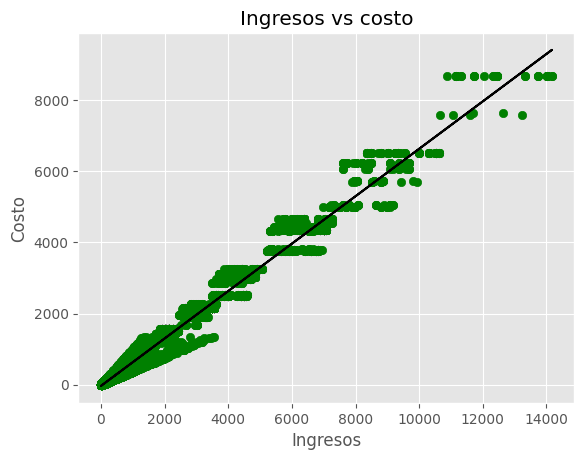

In [ ]:
viz_train = plt
viz_train.scatter(X3_train, y3_train, color = 'g')
viz_train.plot(X3_train, regressor.predict(X3_train), color = 'black')
viz_train.title("Ingresos vs costo")
viz_train.xlabel('Ingresos')
viz_train.ylabel('Costo')
viz_train.show()

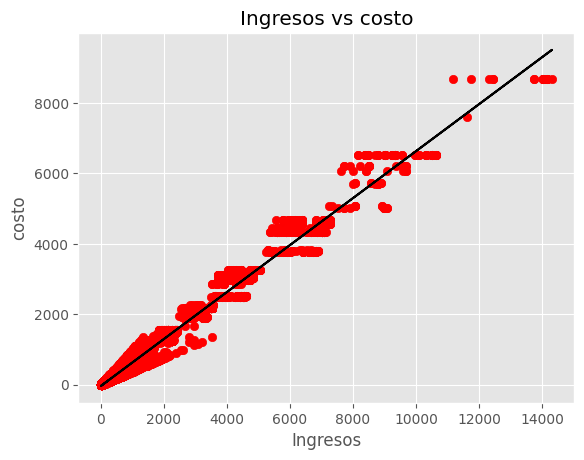

In [ ]:
viz_test = plt
viz_test.scatter(X3_test, y3_test, color = 'red')
viz_test.plot(X3_test, regressor.predict(X3_test), color = 'black')
viz_test.title("Ingresos vs costo")
viz_test.xlabel('Ingresos')
viz_test.ylabel('costo')
viz_test.show()

In [ ]:
y3_pred = regressor.predict(X3_test)
y3_pred.round(0)

array([[-23.],
       [ 29.],
       [195.],
       ...,
       [339.],
       [ 54.],
       [116.]])

In [ ]:
y3_test

,Cost
103062,8
16514,48
39581,130
76651,13
61796,1519
...,...
23043,69
22191,69
99354,209
18594,105


In [ ]:
regressor.score(X3_train, y3_train)

0.9769020864127979

In [ ]:
regressor.score(X3_test, y3_test)

0.9777392533353342

In [ ]:
#Input para ingresar la edad que tiene el usuario
Revenue_cost = float(input('Ingreso en usd. '))

#Predicción del salario que estaria ganando la persona segun la edad digitada.
user_cost = regressor.predict(np.array([Revenue_cost]).reshape(-1, 1))
#user_salary = regressor.predict([Revenue_profit])

#Se convierte la prediccion del salario en entero para no trabajar con decimales
user_cost = int(user_cost)
user_cost
print("Costo: ",user_cost)

Ingreso en usd. 10000
Costo:  6633


Regresion multiple

In [ ]:
df.head()

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418


In [ ]:
X33 = df[['Order_Quantity', 'Unit_Cost', 'Unit_Price','Profit', "Revenue"]]
y33 = df['Cost']

In [ ]:
from sklearn.model_selection import train_test_split
X33_train, X33_test, y33_train, y33_test = train_test_split(X33, y33, test_size=0.3, random_state=42)

In [ ]:
#Entrenamiento del modelo
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X33_train, y33_train)

LinearRegression()

In [ ]:
regressor.coef_

array([-1.81763423e-14,  3.77475828e-15, -2.38697950e-15, -1.00000000e+00,
        1.00000000e+00])

In [ ]:
X33.columns

Index(['Order_Quantity', 'Unit_Cost', 'Unit_Price', 'Profit', 'Revenue'], dtype='object')

In [ ]:
coeff_df = pd.DataFrame(regressor.coef_, X33.columns, columns=['Coefficient'])
coeff_df

,Coefficient
Order_Quantity,-1.817634e-14
Unit_Cost,3.774758e-15
Unit_Price,-2.386980e-15
Profit,-1.000000e+00
Revenue,1.000000e+00


In [ ]:
y33_pred = regressor.predict(X33_test)
y33_pred

array([128., 325., 156., ..., 487.,  36.,  16.])

In [ ]:
y33_test

,Cost
106740,128
30758,325
40669,156
53764,1266
36840,247
...,...
64657,2139
65182,713
69749,487
4795,36


In [ ]:
df33 = pd.DataFrame({'Actual': y33_test, 'Predicted':  y33_pred})
df33['Sesgo']=df33.Actual -df33.Predicted
df33['Error_porc']=((df33.Actual -df33.Predicted)/df33.Actual) *100
df33

,Actual,Predicted,Sesgo,Error_porc
106740,128,128.0,4.263256e-13,3.330669e-13
30758,325,325.0,3.979039e-13,1.224320e-13
40669,156,156.0,3.126388e-13,2.004095e-13
53764,1266,1266.0,-2.273737e-13,-1.796001e-14
36840,247,247.0,3.694822e-13,1.495879e-13
...,...,...,...,...
64657,2139,2139.0,-1.818989e-12,-8.503924e-14
65182,713,713.0,-4.547474e-13,-6.377943e-14
69749,487,487.0,-1.705303e-13,-3.501648e-14
4795,36,36.0,5.258016e-13,1.460560e-12
